<a href="https://colab.research.google.com/github/yuki-2000/Image_processing_lecture/blob/main/IP2022_05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
### 初期設定（このセルの中身は触らなくて良い）
import numpy as np # 数値解析パッケージnumpyのimport
import cv2 # 画像処理パッケージopencvのimport
import matplotlib.pyplot as plt # 描画パッケージmatplotlibのimport
import imutils

# Google Colab固有の設定
from google.colab import files
from google.colab.patches import cv2_imshow

# Google driveのmount
from google.colab import drive
drive.mount('/content/drive/')
# Google Colab用directoryに移動
%cd "/content/drive/MyDrive/Colab Notebooks/画像処理/"

Mounted at /content/drive/
/content/drive/MyDrive/Colab Notebooks/画像処理


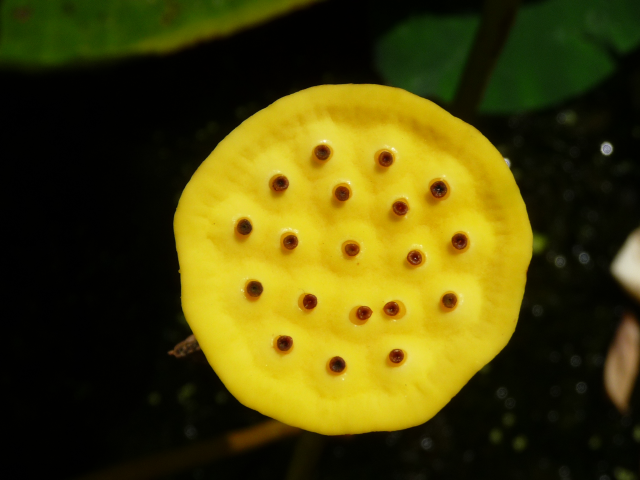

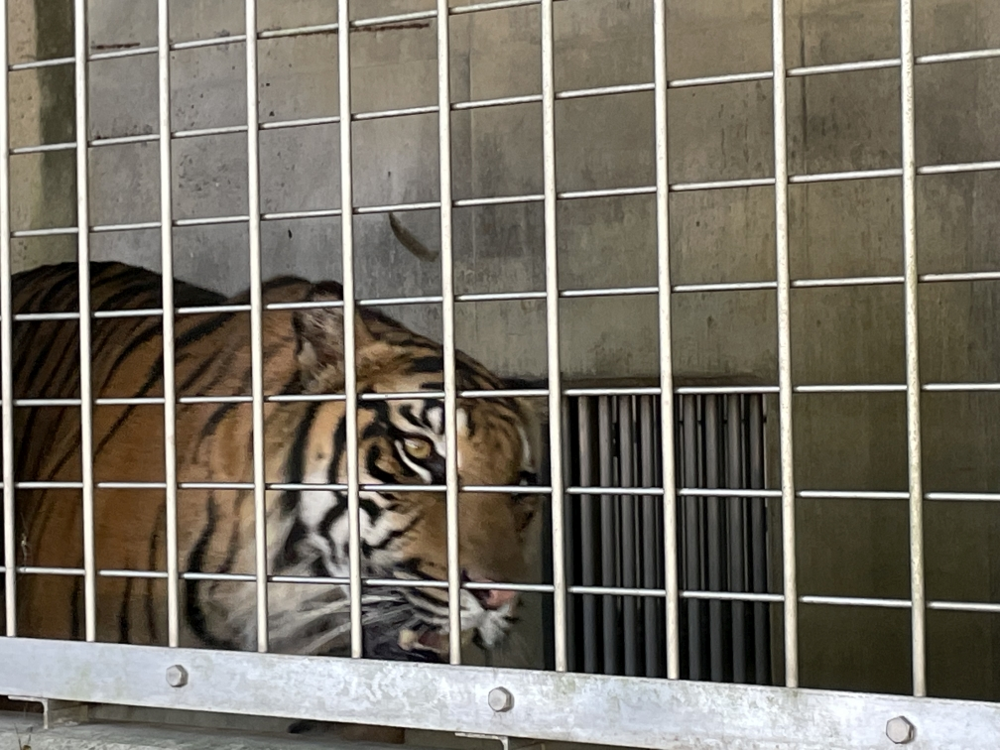

In [ ]:
### 1-1b: 画像の読込と表示（このセルの中身は触らなくて良い）
img1 = imutils.url_to_image('https://bit.ly/3VQeHqI')

# 読み込めなかった場合の例外処理
if img1 is None:
  print('Image file not found.')

# 画像を表示
cv2_imshow(img1)

img2 = imutils.url_to_image('https://bit.ly/3TXpj5u')

# 読み込めなかった場合の例外処理
if img2 is None:
  print('Image file not found.')

# 画像を表示
cv2_imshow(img2)

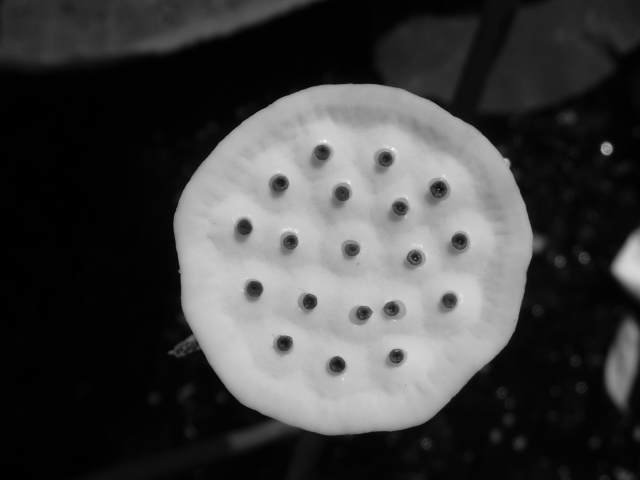

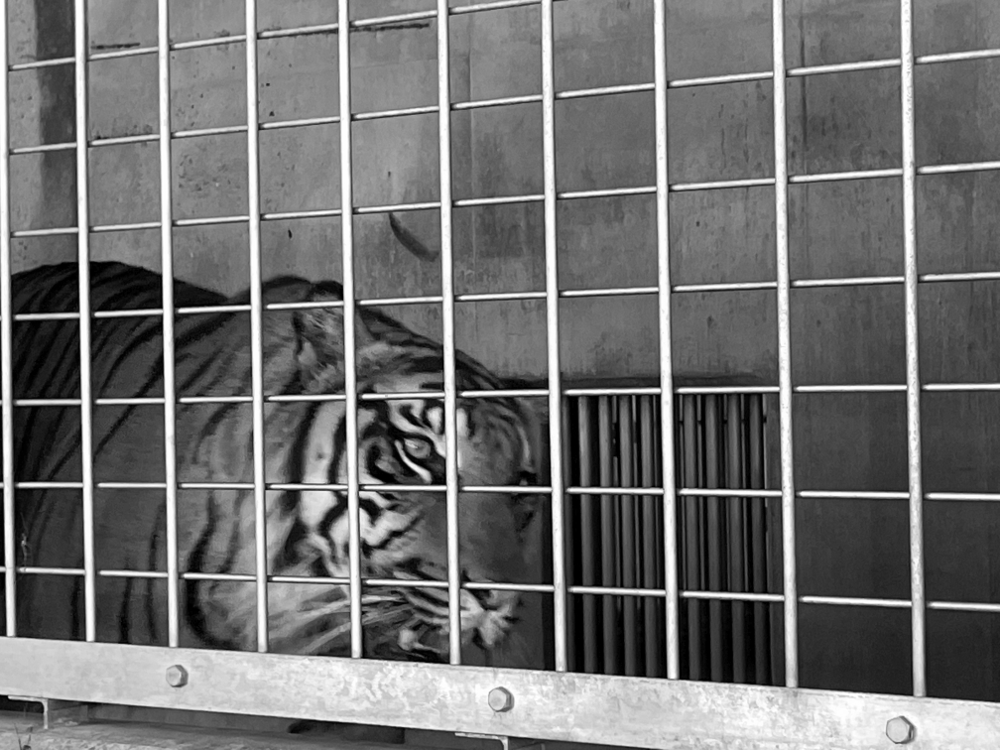

In [ ]:
### 1-2a: 色空間の変換（このセルの中身は触らなくて良い）
gray_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

# 画像の表示
cv2_imshow(gray_img1)

gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# 画像の表示
cv2_imshow(gray_img2)

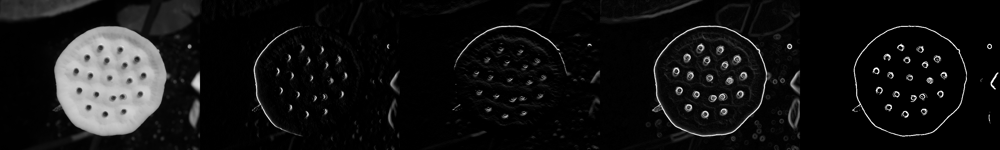

In [ ]:
### 5-1: Sobelフィルタ

# 準備
rows1, cols1 = gray_img1.shape
sobel_edge_img = np.zeros((rows1, cols1), np.uint8) # エッジ強度を記録する黒い画像を用意

# Sobelフィルタの適用
sobel_x = cv2.Sobel(gray_img1, cv2.CV_32F, 1,0,ksize=3) # x方向
sobel_y = cv2.Sobel(gray_img1, cv2.CV_32F, 0,1,ksize=3) # y方向
gradient_img = np.sqrt(sobel_x**2 + sobel_y**2) # 勾配の計算

# ラスタ走査して画素毎に勾配強度で閾値処理
for i in range(rows1):
  for j in range(cols1):
    if gradient_img[i][j] > 127:
      sobel_edge_img[i][j] = 255
    else: 
      sobel_edge_img[i][j] = 0
# 各処理段階の画像を並べて表示
figure = np.hstack((gray_img1, sobel_x, sobel_y,gradient_img,sobel_edge_img ))
cv2_imshow(figure)

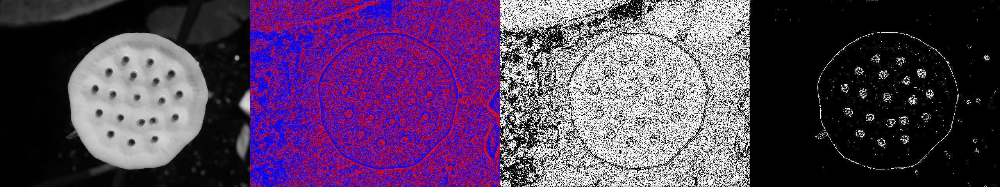

In [ ]:
### 5-2a: Laplacianフィルタ

# 準備
show_laplacian_img_r = np.zeros((rows1, cols1), np.uint8) # Laplacianの値をカラー画像として記録する黒い画像を用意
show_laplacian_img_g = np.zeros((rows1, cols1), np.uint8) # Laplacianの値をカラー画像として記録する黒い画像を用意
show_laplacian_img_b = np.zeros((rows1, cols1), np.uint8) # Laplacianの値をカラー画像として記録する黒い画像を用意
laplacian_edge_img1 = np.zeros((rows1, cols1), np.uint8) # Laplacianの値によるエッジ検出結果を記録する黒い画像を用意
laplacian_edge_img2 = np.zeros((rows1, cols1), np.uint8)  # Laplacianの値によるエッジ検出結果を記録する黒い画像を用意

# Laplacianの適用
laplacian_img = cv2.Laplacian(gray_img1, cv2.CV_32F, ksize=3)
# ラスタ走査して画素毎にLaplacianの値を表示（赤：正，青：負）
for i in range(rows1):
  for j in range(cols1):
    if laplacian_img[i][j] > 0:
      show_laplacian_img_r[i][j] = 255
    else: 
      show_laplacian_img_b[i][j] = 255
# BGRチャネルを統合してカラー画像化
show_laplacian_img = cv2.merge((show_laplacian_img_b, show_laplacian_img_g, show_laplacian_img_r))
# ラスタ走査して画素毎に隣接画素との間でLaplacianの値の0交差をエッジとして検出
for i in range(rows1-1):
  for j in range(cols1-1):
    if laplacian_img[i][j] > 0:
      if laplacian_img[i+1][j] < 0 or laplacian_img[i+1][j+1]  < 0 or laplacian_img[i][j+1] < 0:
        laplacian_edge_img1[i][j] = 255
    elif laplacian_img[i][j] < 0:
      if laplacian_img[i+1][j] > 0 or laplacian_img[i+1][j+1]  > 0 or laplacian_img[i][j+1] > 0:
        laplacian_edge_img1[i][j] = 255
#  ラスタ走査して画素毎に隣接画素との間でLaplacianの値の0交差をエッジとして検出（雑音除去のため小さい値（±N以下）は無視）

N=32
for i in range(rows1-1):
  for j in range(cols1-1):
    if laplacian_img[i][j] > N:
      if laplacian_img[i+1][j] < 0 or laplacian_img[i+1][j+1]  < 0 or laplacian_img[i][j+1] < 0:
        laplacian_edge_img2[i][j] = 255
    elif laplacian_img[i][j] < -N:
      if laplacian_img[i+1][j] > 0 or laplacian_img[i+1][j+1]  > 0 or laplacian_img[i][j+1] > 0:
        laplacian_edge_img2[i][j] = 255
# 各処理段階の画像を並べて表示
figure = np.hstack((cv2.cvtColor(gray_img1,cv2.COLOR_GRAY2RGB), show_laplacian_img, cv2.cvtColor(laplacian_edge_img1,cv2.COLOR_GRAY2RGB), cv2.cvtColor(laplacian_edge_img2,cv2.COLOR_GRAY2RGB)))
cv2_imshow(figure)
 # 同じ大きさの画像を並べる必要があるので濃淡画像もRGB画像に変換
 # 同じ大きさの画像を並べる必要があるので濃淡画像もRGB画像に変換
 # 同じ大きさの画像を並べる必要があるので濃淡画像もRGB画像に変換


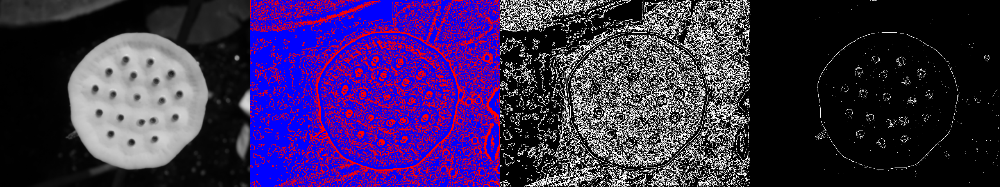

In [ ]:
### 5-2b: Laplacian of Gaussianフィルタ

# 準備
show_laplacian_img_r = np.zeros((rows1, cols1), np.uint8) # Laplacianの値をカラー画像として記録する黒い画像を用意
show_laplacian_img_g = np.zeros((rows1, cols1), np.uint8) # Laplacianの値をカラー画像として記録する黒い画像を用意
show_laplacian_img_b = np.zeros((rows1, cols1), np.uint8) # Laplacianの値をカラー画像として記録する黒い画像を用意
log_edge_img1 = np.zeros((rows1, cols1), np.uint8) # Laplacianの値によるエッジ検出結果を記録する黒い画像を用意
log_edge_img2 = np.zeros((rows1, cols1), np.uint8)  # Laplacianの値によるエッジ検出結果を記録する黒い画像を用意


# まず，元画像をGaussianフィルタでぼかす（雑音除去）
blurred_img = cv2.GaussianBlur(gray_img1, (5,5), 0)
# それからLaplacianを適用（これ移行の処理は5-2aとほぼ一緒）
laplacian_img = cv2.Laplacian(blurred_img, cv2.CV_32F, ksize=3)
# ラスタ走査して画素毎にLaplacianの値を表示（赤：正，青：負）
for i in range(rows1):
  for j in range(cols1):
    if laplacian_img[i][j] > 0:
      show_laplacian_img_r[i][j] = 255
    else: 
      show_laplacian_img_b[i][j] = 255
# BGRチャネルを統合してカラー画像化
show_laplacian_img = cv2.merge((show_laplacian_img_b, show_laplacian_img_g, show_laplacian_img_r))
# ラスタ走査して画素毎に隣接画素との間でLaplacianの値の0交差をエッジとして検出
for i in range(rows1-1):
  for j in range(cols1-1):
    if laplacian_img[i][j] > 0:
      if laplacian_img[i+1][j] < 0 or laplacian_img[i+1][j+1]  < 0 or laplacian_img[i][j+1] < 0:
        log_edge_img1[i][j] = 255
    elif laplacian_img[i][j] < 0:
      if laplacian_img[i+1][j] > 0 or laplacian_img[i+1][j+1]  > 0 or laplacian_img[i][j+1] > 0:
        log_edge_img1[i][j] = 255
#  ラスタ走査して画素毎に隣接画素との間でLaplacianの値の0交差をエッジとして検出（雑音除去のため小さい値（±N以下）は無視）

N=8
for i in range(rows1-1):
  for j in range(cols1-1):
    if laplacian_img[i][j] > N:
      if laplacian_img[i+1][j] < 0 or laplacian_img[i+1][j+1]  < 0 or laplacian_img[i][j+1] < 0:
        log_edge_img2[i][j] = 255
    elif laplacian_img[i][j] < -N:
      if laplacian_img[i+1][j] > 0 or laplacian_img[i+1][j+1]  > 0 or laplacian_img[i][j+1] > 0:
        log_edge_img2[i][j] = 255
# 各処理段階の画像を並べて表示
figure = np.hstack((cv2.cvtColor(blurred_img,cv2.COLOR_GRAY2RGB), show_laplacian_img, cv2.cvtColor(log_edge_img1,cv2.COLOR_GRAY2RGB), cv2.cvtColor(log_edge_img2,cv2.COLOR_GRAY2RGB)))
cv2_imshow(figure)
 # 同じ大きさの画像を並べる必要があるので濃淡画像もRGB画像に変換
 # 同じ大きさの画像を並べる必要があるので濃淡画像もRGB画像に変換
 # 同じ大きさの画像を並べる必要があるので濃淡画像もRGB画像に変換

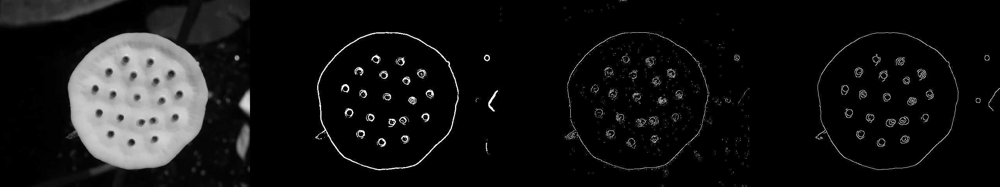

In [ ]:
### 5-3: Cannyのエッジ検出法

# Cannyのエッジ検出を適用
canny_edge_img1 =  cv2.Canny(gray_img1, threshold1=100, threshold2=200)

# Sobel, LoG, Cannyの結果を並べて表示
figure = np.hstack((gray_img1,sobel_edge_img,log_edge_img2,canny_edge_img1))
cv2_imshow(figure)

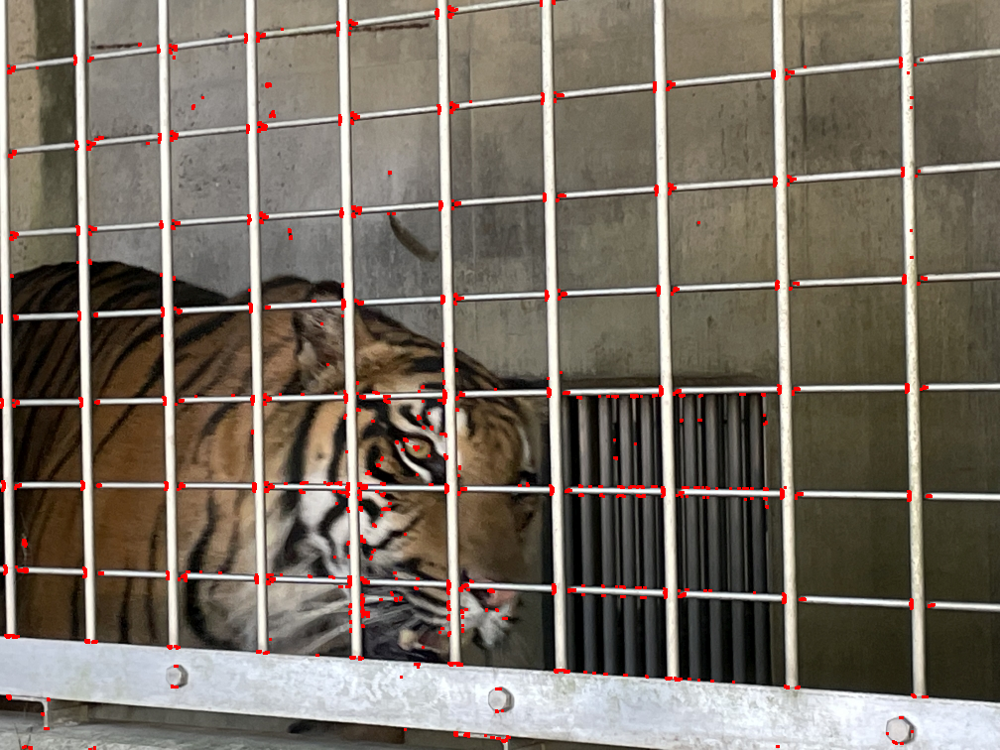

In [ ]:
### 5-4a: Harrisコーナ検出

# Harrisコーナ検出を適用
corner_img = cv2.cornerHarris(gray_img2, 2,3,0.05) # 入力画像 
 # blockSize 勾配を計算する近傍の大きさ
 # ksize Sobelフィルタの大きさ
 # k 対角成分の項に乗じる係数α


# 表示のために検出されたコーナ強度を膨張（3x3近傍を近傍内の最大値で埋める）
corner_img = cv2.dilate(corner_img,None)
# 元画像を複製
harris_img = img2.copy()
# 複製した元画像の上にコーナらしさが強い点（最大値の0.01倍より強い）を赤画素で表示
harris_img[corner_img>0.01*corner_img.max()]=[0,0,255]
cv2_imshow(harris_img)

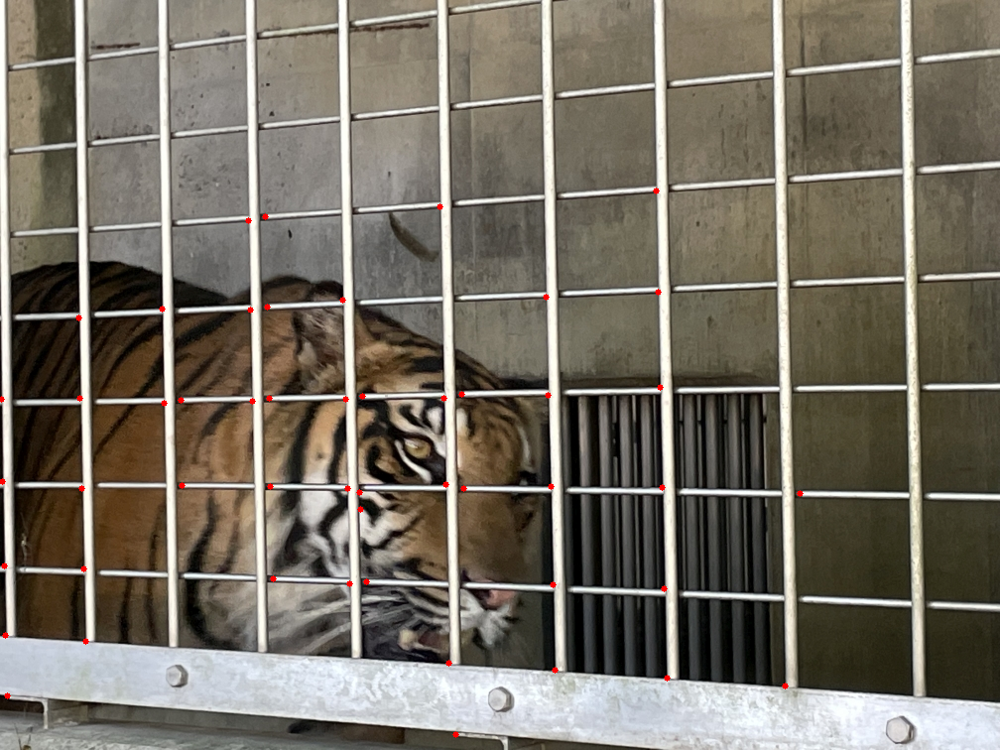

In [ ]:
### 5-4b: Shi-Tomasiコーナ検出

# Shi-Tomasiコーナ検出を適用
corners = cv2.goodFeaturesToTrack(gray_img2, 50,0.01,10) 
 # 入力画像
 # 最大検出数
 # 最低品質
 # 検出コーナ間の最低距離（Euclid距離）
shitomasi_img = img2.copy()
# 元画像を複製

# 複製した元画像の上に検出されたコーナ点を赤い円で表示
if len(corners) > 0:
  for i in corners:
    x,y = i.ravel()
    cv2.circle(shitomasi_img, center=(int(x),int(y)), radius=3, color=(0,0,255), thickness=-1)
cv2_imshow(shitomasi_img)
#失敗

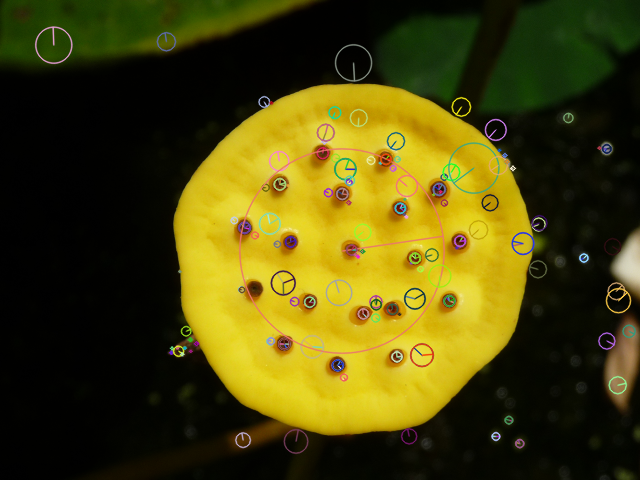

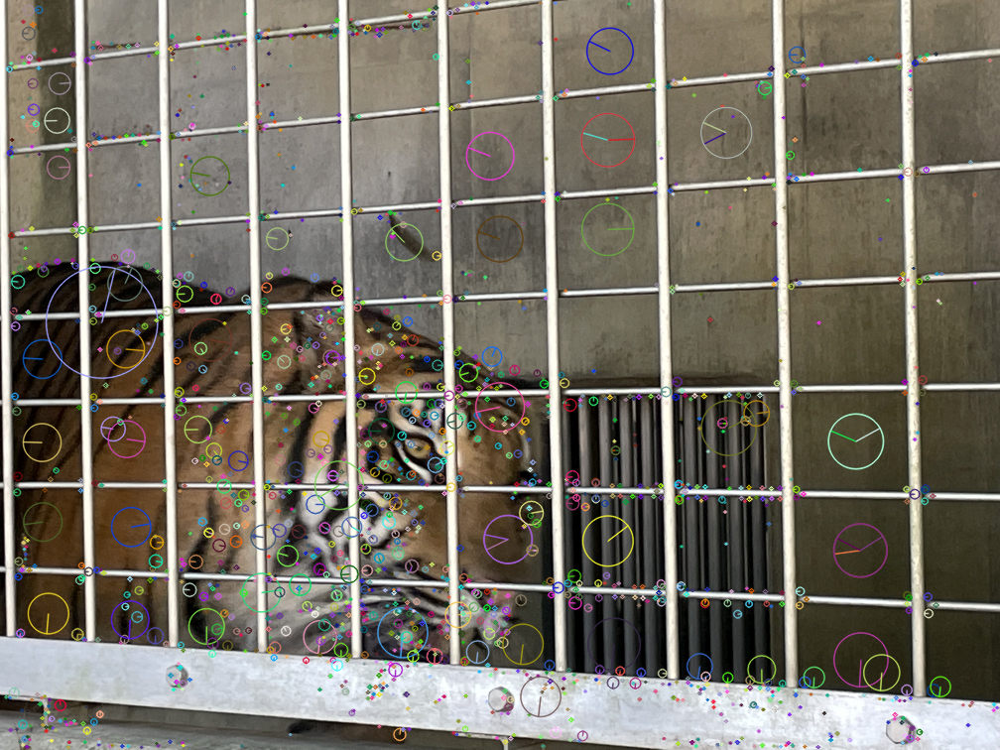

In [ ]:
### 5-5: SIFT

# 準備
sift1 = cv2.SIFT_create() # SIFT特徴抽出オブジェクトの作成
sift2 = cv2.SIFT_create()  # SIFT特徴抽出オブジェクトの作成

# gray_img1にSIFTを適用
keypoints, descriptors = sift1.detectAndCompute(gray_img1, None)
# 元画像の上に特徴点を重ねた画像を出力
sift_img1 = cv2.drawKeypoints(img1, keypoints, None, flags=4)
cv2_imshow(sift_img1)
# gray_img2にSIFTを適用
keypoints, descriptors = sift2.detectAndCompute(gray_img2, None)
# 元画像の上に特徴点を重ねた画像を出力
sift_img2 = cv2.drawKeypoints(img2, keypoints, None, flags=4)
cv2_imshow(sift_img2)

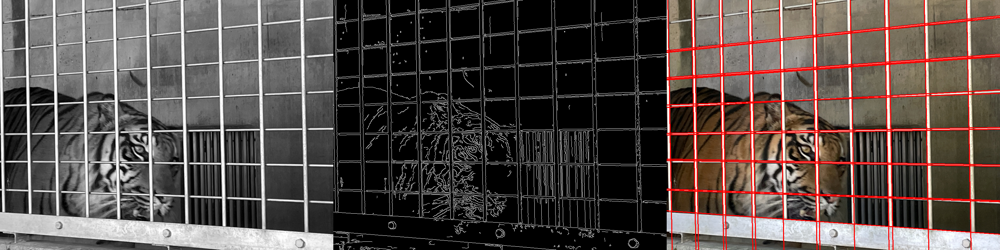

In [ ]:
### 5-6: Hough変換

# 準備
hough_img = img2.copy() # 結果出力用に元画像を複製

# まずはCannyのエッジ検出
canny_edge_img = cv2.Canny(gray_img2, threshold1=100, threshold2=200)
# 次にHough変換を適用
lines = cv2.HoughLines(canny_edge_img, rho=1, theta=np.pi/180, threshold=300)
# 線を描画するために，画面外の十分遠くの位置を設定
N=1500
# 検出された各パラメータの組について線分を描画
for line in lines:
  rho, theta = line[0]
  a = np.cos(theta)
  b=np.sin(theta)
  x0 = a*rho
  y0 = b*rho
  x1 = int(x0+N*(-b))
  y1 = int(y0 + N*a)
  x2= int(x0-N*(-b))
  y2 = int(y0-N*a)
  cv2.line(hough_img, pt1=(x1,y1), pt2=(x2,y2), color=(0,0,255), thickness=2)
# 処理過程を並べて表示
figure = np.hstack((cv2.cvtColor(gray_img2,cv2.COLOR_GRAY2RGB), cv2.cvtColor(canny_edge_img,cv2.COLOR_GRAY2RGB),hough_img))
cv2_imshow(figure)

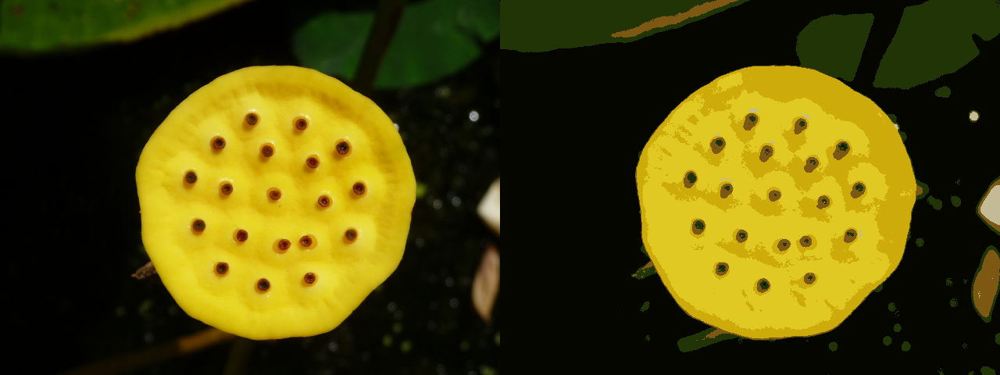

In [ ]:
### 5-7a: 領域分割（k平均法）
z = img1.reshape((-1,3))
# 画像を画素毎の3次元ベクトル群として表現
z = np.float32(z)
# クラスタリングのためにnp.float32に変換

# criteriaとクラスタ数Kを定義しkmeans関数を適用してクラスタリング
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10,1.0) # 精度または反復回数の終了判定
 # 最大反復回数
 # 精度

K=6 # クラスタ数

ret,label, center = cv2.kmeans(z,K,None, criteria, 10, flags=cv2.KMEANS_RANDOM_CENTERS)
 # 対象データ
 # クラスタ数
 # ラベル
 # 終了判定基準
 # 初期値を変えた試行回数
 # 重心の初期値決定方法

# uint8型に戻して元の画像を復元
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img1.shape))
# 元画像と領域分割結果を並べて表示
figure = np.hstack((img1, res2))
cv2_imshow(figure)

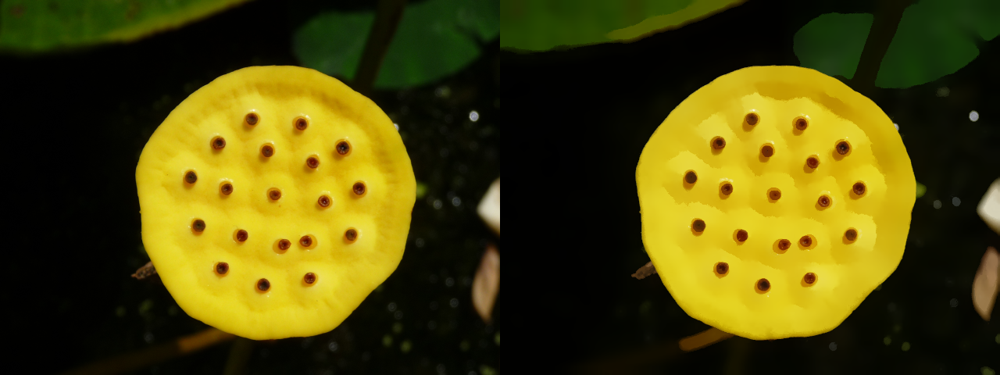

In [ ]:
### 5-7b: 領域分割（平均値シフト法）

res = cv2.pyrMeanShiftFiltering(img1, 10,20)
# 元画像に平均値シフト法を適用
 # 入力画像 
 # 空間窓の半径
 # 色空間窓の半径

# 元画像と領域分割結果を並べて表示
figure = np.hstack((img1, res))
cv2_imshow(figure)